<a href="https://colab.research.google.com/github/vienskaz/ECG-CNN/blob/GAN/EKG_GAN_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras import layers, models
import seaborn as sns
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense


In [3]:
mit_test_data = pd.read_csv('/content/drive/MyDrive/ecg/mitbih_test.csv', header=None)
mit_train_data = pd.read_csv('/content/drive/MyDrive/ecg/mitbih_train.csv', header=None)

X_train = mit_train_data.iloc[:, :-1].values
y_train = mit_train_data.iloc[:, -1].values
X_test = mit_test_data.iloc[:, :-1].values
y_test = mit_test_data.iloc[:, -1].values

normal = pd.read_csv('/content/drive/MyDrive/ecg/ptbdb_normal.csv', header=None)
abnormal = pd.read_csv('/content/drive/MyDrive/ecg/ptbdb_abnormal.csv', header=None)
X_normal = normal.iloc[:, :-1].values
y_normal = np.zeros(X_normal.shape[0])
X_abnormal = abnormal.iloc[:, :-1].values
y_abnormal = np.ones(X_abnormal.shape[0])

X = np.concatenate([X_normal, X_abnormal], axis=0)
y = np.concatenate([y_normal, y_abnormal], axis=0)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
X = X.reshape((X.shape[0], X.shape[1], 1))

Y_train = to_categorical(y_train)
Y_test = to_categorical(y_test)

In [4]:
def moving_average_filter(signal, window_size=5):
    filtered=[]
    for data in signal:
      filtered_ecg = np.convolve(data.flatten(), np.ones(window_size) / window_size, mode='same')
      filtered.append(filtered_ecg)
    return np.array(filtered)


In [5]:
two = []
three = []
four = []
five = []

for i in range(len(Y_train)):
    if np.array_equal(Y_train[i], [0.0, 1.0, 0.0, 0.0, 0.0]):
        two.append(X_train[i])
    elif np.array_equal(Y_train[i], [0.0, 0.0, 1.0, 0.0, 0.0]):
        three.append(X_train[i])
    elif np.array_equal(Y_train[i], [0.0, 0.0, 0.0, 1.0, 0.0]):
        four.append(X_train[i])
    elif np.array_equal(Y_train[i], [0.0, 0.0, 0.0, 0.0, 1.0]):
        five.append(X_train[i])




In [6]:
np.array(two)
np.array(three)
np.array(four )
np.array(five )

array([[[0.71260995],
        [0.62903225],
        [0.52785921],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[1.        ],
        [0.4848485 ],
        [0.54166669],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.58404559],
        [0.5       ],
        [0.42450142],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       ...,

       [[0.90612245],
        [0.62448978],
        [0.59591836],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.85822785],
        [0.64556962],
        [0.84556961],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.90150636],
        [0.84588647],
        [0.80069524],
        ...,
        [0.        ],
        [0.        ],
        [0.        ]]])

In [7]:
print(len(two))
print(len(three))
print(len(four))
print(len(five))

2223
5788
641
6431


In [8]:
two = moving_average_filter(two)
three = moving_average_filter(three)
four = moving_average_filter(four)
five = moving_average_filter(five)

In [ ]:
print(two[0].shape)

(187,)


In [9]:
def build_discriminator(n=187):
    inps = layers.Input(shape=(n,))
    x = Dense(512, activation='relu')(inps)
    x = Dense(512, activation='relu')(x)
    x = Dense(256, activation='relu')(x)
    outs = Dense(1, activation='sigmoid')(x)
    model = models.Model(inps, outs, name='discriminator')
    return model

# Generator definition with the correct activation function


def build_generator(latent_dim=20, output_shape=(187, 1)):
    inps = layers.Input(shape=(latent_dim,))
    x = Dense(256, activation='relu')(inps)
    x = Dense(256, activation='relu')(x)
    outs = Dense(187, activation='tanh')(x)
    model = models.Model(inps, outs, name='generator')
    return model



discriminator = build_discriminator()
generator = build_generator(latent_dim=20)
print(discriminator.summary())
print(generator.summary())

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 187)]             0         
                                                                 
 dense (Dense)               (None, 512)               96256     
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 1)                 257       
                                                                 
Total params: 490497 (1.87 MB)
Trainable params: 490497 (1.87 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Model: "gene

In [10]:
class GAN(keras.Model):

    def __init__(self, disc, gen, latent_dim=20):
        super(GAN, self).__init__()
        self.discriminator = disc
        self.generator = gen
        self.latent_dim = latent_dim

    def compile(self, optD, optG, loss_fn):
        super(GAN, self).compile()
        self.optD = optD
        self.optG = optG
        self.loss_fn = loss_fn

    def train_step(self, real_data):
        if isinstance(real_data, tuple):
            real_data = real_data[0]

        bs = tf.shape(real_data)[0]
        z = tf.random.normal(shape=(bs, self.latent_dim))
        fake_data = self.generator(z)

        combined_data = tf.concat([real_data, fake_data], axis=0)
        labels = tf.concat([tf.ones((bs, 1)), tf.zeros((bs, 1))], axis=0)

        with tf.GradientTape() as tape:
            preds = self.discriminator(combined_data)
            d_loss = self.loss_fn(labels, preds)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.optD.apply_gradients(zip(grads, self.discriminator.trainable_weights))

        misleading_labels = tf.ones((bs, 1))
        z = tf.random.normal(shape=(bs, self.latent_dim))

        with tf.GradientTape() as tape:
            fake_preds = self.discriminator(self.generator(z))
            g_loss = self.loss_fn(misleading_labels, fake_preds)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.optG.apply_gradients(zip(grads, self.generator.trainable_weights))

        return {"d_loss": d_loss, "g_loss": g_loss}

gan = GAN(discriminator, generator)

gan.compile(
    optD=keras.optimizers.Adam(learning_rate=0.0001),
    optG=keras.optimizers.Adam(learning_rate=0.001),
    loss_fn=keras.losses.BinaryCrossentropy(),
)


In [11]:
def show_samples(epoch, generator, data, n=187, l_dim=20):
  generated_points_list=[]
  if epoch % 100 == 0:
    z = tf.random.normal(shape=(n, l_dim))
    generated_data = generator(z)
    generated_points_list.append(generated_data)
    plt.plot(generated_data)
    plt.show()


Epoch 1/2000
17/21 [=======================>......] - ETA: 0s - d_loss: 0.7907 - g_loss: 0.5001

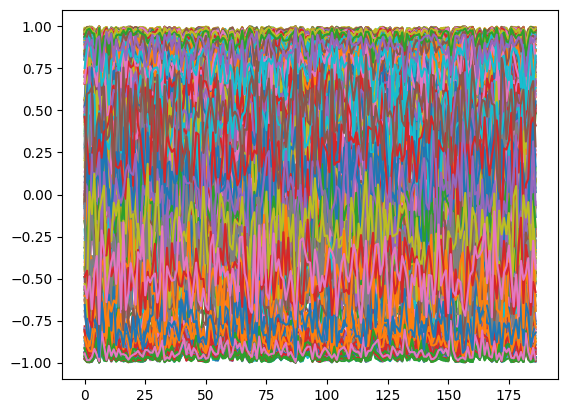

21/21 [==============================] - 3s 49ms/step - d_loss: 0.7316 - g_loss: 0.6027
Epoch 2/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.3618 - g_loss: 1.5404
Epoch 3/2000
21/21 [==============================] - 0s 15ms/step - d_loss: 0.3056 - g_loss: 1.9746
Epoch 4/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3206 - g_loss: 2.2199
Epoch 5/2000
21/21 [==============================] - 0s 11ms/step - d_loss: 0.3854 - g_loss: 1.7732
Epoch 6/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4617 - g_loss: 1.6422
Epoch 7/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4938 - g_loss: 1.5771
Epoch 8/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.5395 - g_loss: 1.2077
Epoch 9/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.6584 - g_loss: 0.7449
Epoch 10/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.7139 - g_loss: 0.6904
Ep

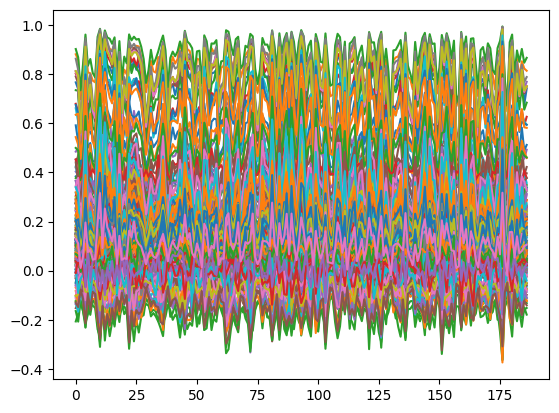

21/21 [==============================] - 1s 36ms/step - d_loss: 0.8372 - g_loss: 0.8472
Epoch 102/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.6885 - g_loss: 1.1154
Epoch 103/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.5728 - g_loss: 0.9047
Epoch 104/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.5460 - g_loss: 0.8159
Epoch 105/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.5480 - g_loss: 0.8462
Epoch 106/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.6035 - g_loss: 1.0726
Epoch 107/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.4512 - g_loss: 1.3857
Epoch 108/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.6216 - g_loss: 1.1995
Epoch 109/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.7593 - g_loss: 1.0556
Epoch 110/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.5963 - 

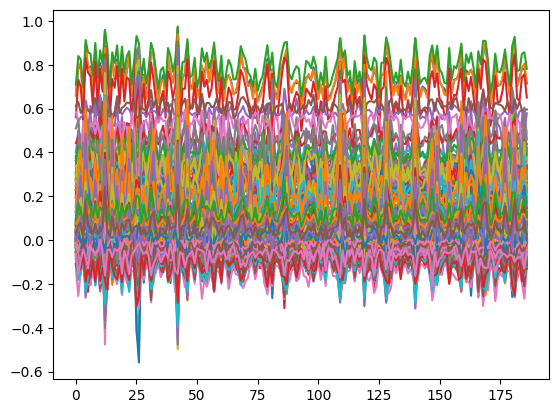

21/21 [==============================] - 1s 35ms/step - d_loss: 0.3171 - g_loss: 2.4770
Epoch 202/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3523 - g_loss: 2.5201
Epoch 203/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.5003 - g_loss: 2.0134
Epoch 204/2000
21/21 [==============================] - 0s 11ms/step - d_loss: 0.5182 - g_loss: 1.6366
Epoch 205/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.2889 - g_loss: 1.8895
Epoch 206/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.3284 - g_loss: 1.8423
Epoch 207/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4401 - g_loss: 2.0534
Epoch 208/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.2252 - g_loss: 1.9819
Epoch 209/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4119 - g_loss: 1.9998
Epoch 210/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4774 - 

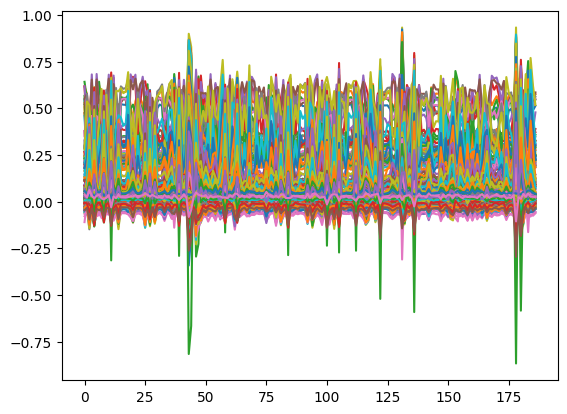

21/21 [==============================] - 1s 44ms/step - d_loss: 0.4921 - g_loss: 1.6199
Epoch 302/2000
21/21 [==============================] - 0s 18ms/step - d_loss: 0.2559 - g_loss: 1.4521
Epoch 303/2000
21/21 [==============================] - 0s 15ms/step - d_loss: 0.2277 - g_loss: 1.6865
Epoch 304/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3537 - g_loss: 1.9056
Epoch 305/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2398 - g_loss: 1.8962
Epoch 306/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2542 - g_loss: 2.1863
Epoch 307/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.5294 - g_loss: 1.9923
Epoch 308/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.3794 - g_loss: 1.7202
Epoch 309/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.2836 - g_loss: 1.5799
Epoch 310/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3850 - 

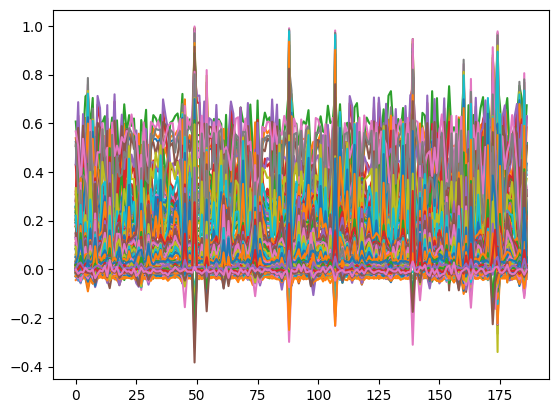

21/21 [==============================] - 1s 56ms/step - d_loss: 0.4562 - g_loss: 1.4025
Epoch 402/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.4484 - g_loss: 1.2670
Epoch 403/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.4466 - g_loss: 1.2464
Epoch 404/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3350 - g_loss: 1.2859
Epoch 405/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3780 - g_loss: 1.4466
Epoch 406/2000
21/21 [==============================] - 0s 18ms/step - d_loss: 0.3487 - g_loss: 1.4806
Epoch 407/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.3754 - g_loss: 1.4774
Epoch 408/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.4363 - g_loss: 1.7094
Epoch 409/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3940 - g_loss: 1.7472
Epoch 410/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3605 - 

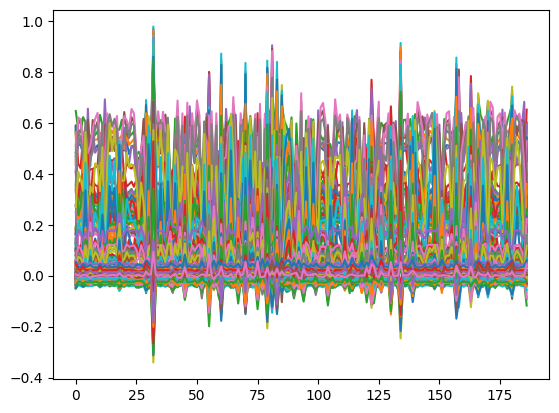

21/21 [==============================] - 1s 35ms/step - d_loss: 0.3536 - g_loss: 2.1017
Epoch 502/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.1484 - g_loss: 2.3426
Epoch 503/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.1687 - g_loss: 2.2534
Epoch 504/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2608 - g_loss: 2.2423
Epoch 505/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4162 - g_loss: 2.4481
Epoch 506/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3837 - g_loss: 2.2893
Epoch 507/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.1730 - g_loss: 2.3283
Epoch 508/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.2032 - g_loss: 2.4072
Epoch 509/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2413 - g_loss: 2.1625
Epoch 510/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4260 - 

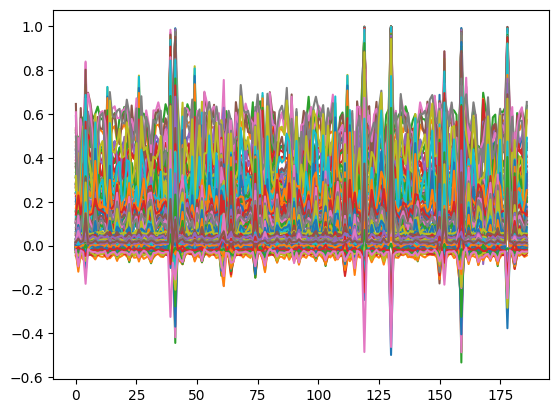

21/21 [==============================] - 1s 44ms/step - d_loss: 0.1988 - g_loss: 3.0490
Epoch 602/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.1718 - g_loss: 3.1429
Epoch 603/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2839 - g_loss: 2.9665
Epoch 604/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.1765 - g_loss: 2.9772
Epoch 605/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.1480 - g_loss: 3.3211
Epoch 606/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2280 - g_loss: 3.0603
Epoch 607/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.1533 - g_loss: 3.3061
Epoch 608/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.1705 - g_loss: 3.4978
Epoch 609/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2313 - g_loss: 3.3432
Epoch 610/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2306 - 

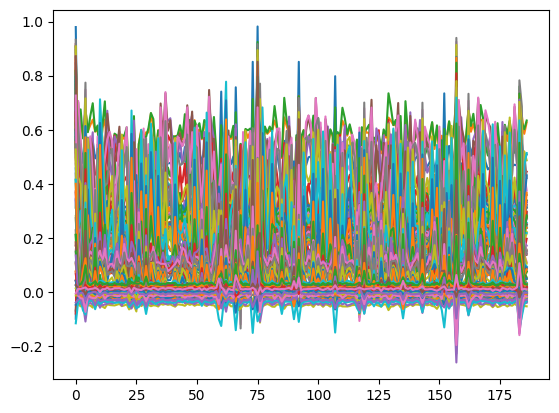

21/21 [==============================] - 1s 43ms/step - d_loss: 0.3630 - g_loss: 2.5443
Epoch 702/2000
21/21 [==============================] - 0s 15ms/step - d_loss: 0.2550 - g_loss: 2.3663
Epoch 703/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.2840 - g_loss: 2.3523
Epoch 704/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.1870 - g_loss: 2.4021
Epoch 705/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3559 - g_loss: 2.2653
Epoch 706/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.4482 - g_loss: 2.5091
Epoch 707/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.2553 - g_loss: 2.2492
Epoch 708/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2838 - g_loss: 2.1367
Epoch 709/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2717 - g_loss: 2.0886
Epoch 710/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2541 - 

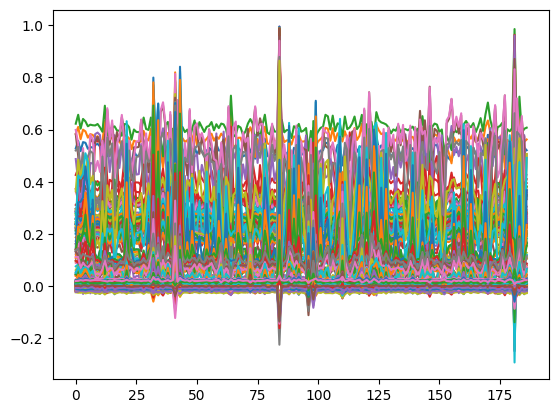

21/21 [==============================] - 1s 41ms/step - d_loss: 0.4008 - g_loss: 2.5347
Epoch 802/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3091 - g_loss: 1.9252
Epoch 803/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3625 - g_loss: 1.7786
Epoch 804/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3602 - g_loss: 1.5012
Epoch 805/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2829 - g_loss: 1.8115
Epoch 806/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3090 - g_loss: 1.9541
Epoch 807/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3908 - g_loss: 2.2419
Epoch 808/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4062 - g_loss: 2.6347
Epoch 809/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2682 - g_loss: 2.0676
Epoch 810/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2232 - 

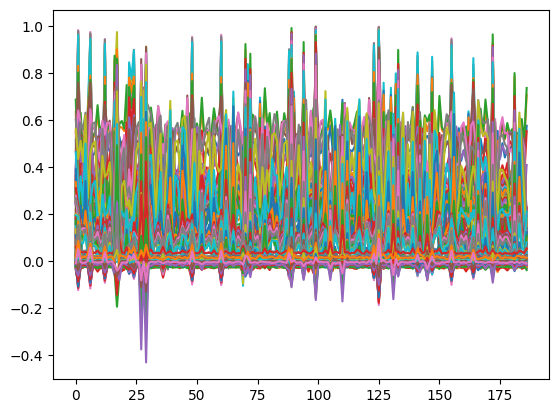

21/21 [==============================] - 1s 56ms/step - d_loss: 0.3258 - g_loss: 3.2103
Epoch 902/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.2802 - g_loss: 2.7741
Epoch 903/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3799 - g_loss: 2.8557
Epoch 904/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.3125 - g_loss: 2.5940
Epoch 905/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2876 - g_loss: 2.6802
Epoch 906/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2822 - g_loss: 2.4852
Epoch 907/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2982 - g_loss: 2.5368
Epoch 908/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4343 - g_loss: 2.2136
Epoch 909/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2753 - g_loss: 2.7891
Epoch 910/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4229 - 

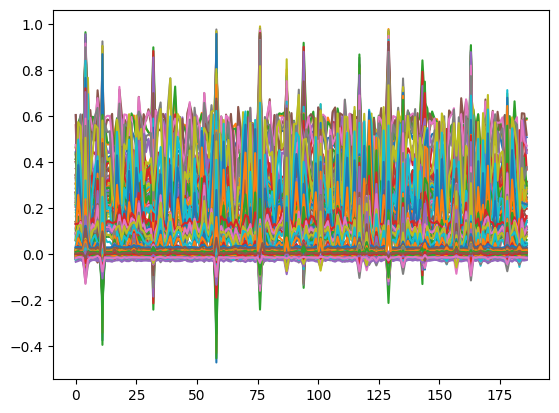

21/21 [==============================] - 1s 46ms/step - d_loss: 0.2332 - g_loss: 2.5273
Epoch 1002/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.3588 - g_loss: 2.2095
Epoch 1003/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.3445 - g_loss: 2.1437
Epoch 1004/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.2350 - g_loss: 2.1134
Epoch 1005/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.2940 - g_loss: 2.3570
Epoch 1006/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3617 - g_loss: 2.4578
Epoch 1007/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.2598 - g_loss: 2.1554
Epoch 1008/2000
21/21 [==============================] - 0s 15ms/step - d_loss: 0.3429 - g_loss: 1.9307
Epoch 1009/2000
21/21 [==============================] - 0s 15ms/step - d_loss: 0.2987 - g_loss: 2.1082
Epoch 1010/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 

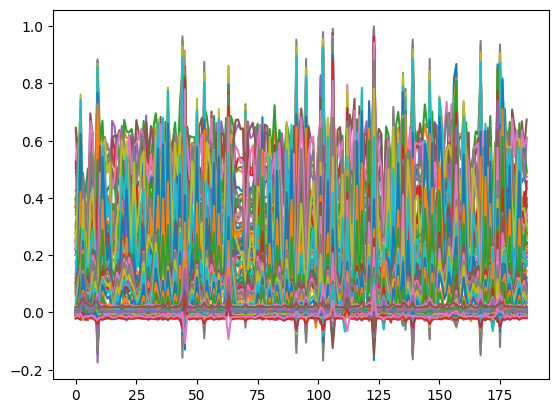

21/21 [==============================] - 1s 42ms/step - d_loss: 0.4132 - g_loss: 1.6709
Epoch 1102/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.4380 - g_loss: 1.9018
Epoch 1103/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3612 - g_loss: 1.9081
Epoch 1104/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2809 - g_loss: 1.7949
Epoch 1105/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3493 - g_loss: 2.0658
Epoch 1106/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3823 - g_loss: 2.1975
Epoch 1107/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3377 - g_loss: 2.1095
Epoch 1108/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4438 - g_loss: 1.9641
Epoch 1109/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.5517 - g_loss: 1.9724
Epoch 1110/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 

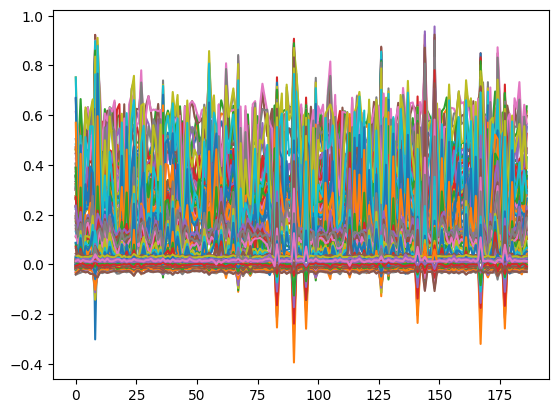

21/21 [==============================] - 2s 76ms/step - d_loss: 0.3923 - g_loss: 2.0749
Epoch 1202/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2225 - g_loss: 2.0688
Epoch 1203/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4313 - g_loss: 2.1740
Epoch 1204/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2421 - g_loss: 2.2935
Epoch 1205/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3250 - g_loss: 2.3311
Epoch 1206/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2516 - g_loss: 2.5203
Epoch 1207/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2993 - g_loss: 2.3905
Epoch 1208/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.1955 - g_loss: 2.4785
Epoch 1209/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3562 - g_loss: 2.3937
Epoch 1210/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 

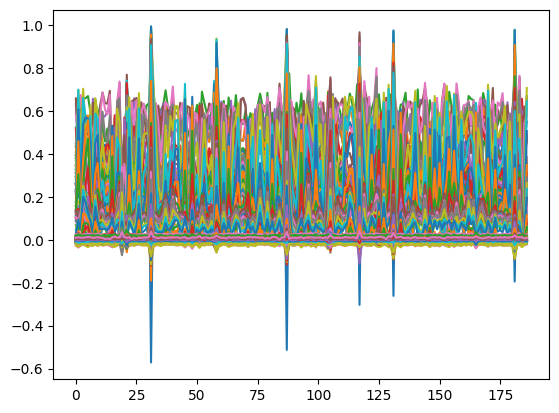

21/21 [==============================] - 1s 47ms/step - d_loss: 0.3917 - g_loss: 1.7619
Epoch 1302/2000
21/21 [==============================] - 0s 15ms/step - d_loss: 0.3404 - g_loss: 1.7157
Epoch 1303/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.4277 - g_loss: 1.7320
Epoch 1304/2000
21/21 [==============================] - 0s 18ms/step - d_loss: 0.4357 - g_loss: 1.6691
Epoch 1305/2000
21/21 [==============================] - 0s 18ms/step - d_loss: 0.3499 - g_loss: 1.8189
Epoch 1306/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3122 - g_loss: 1.8216
Epoch 1307/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2539 - g_loss: 1.8154
Epoch 1308/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4295 - g_loss: 2.0146
Epoch 1309/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.3419 - g_loss: 2.0015
Epoch 1310/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 

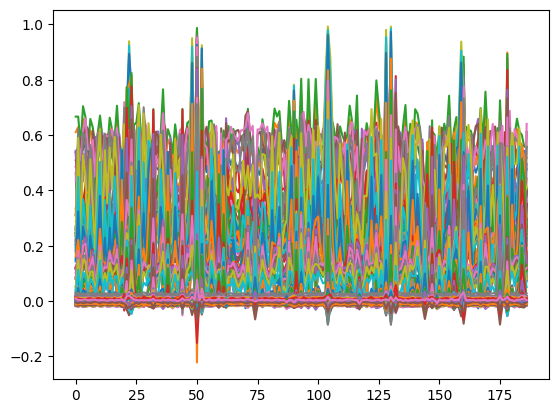

21/21 [==============================] - 1s 44ms/step - d_loss: 0.3587 - g_loss: 2.0119
Epoch 1402/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3975 - g_loss: 1.9574
Epoch 1403/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3205 - g_loss: 1.7470
Epoch 1404/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3826 - g_loss: 1.8025
Epoch 1405/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3631 - g_loss: 1.6555
Epoch 1406/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3932 - g_loss: 1.5778
Epoch 1407/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.5897 - g_loss: 1.5412
Epoch 1408/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4240 - g_loss: 1.3352
Epoch 1409/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3586 - g_loss: 1.5212
Epoch 1410/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 

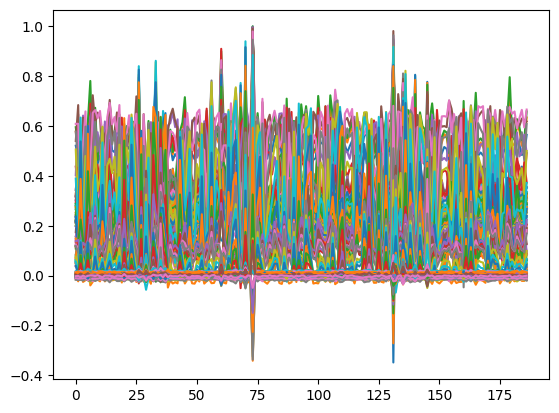

21/21 [==============================] - 1s 46ms/step - d_loss: 0.3360 - g_loss: 1.6914
Epoch 1502/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3908 - g_loss: 1.8346
Epoch 1503/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3880 - g_loss: 1.7355
Epoch 1504/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.2687 - g_loss: 1.7807
Epoch 1505/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4820 - g_loss: 1.6458
Epoch 1506/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3683 - g_loss: 1.7639
Epoch 1507/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3216 - g_loss: 1.7507
Epoch 1508/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3248 - g_loss: 1.5785
Epoch 1509/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.5257 - g_loss: 1.8156
Epoch 1510/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 

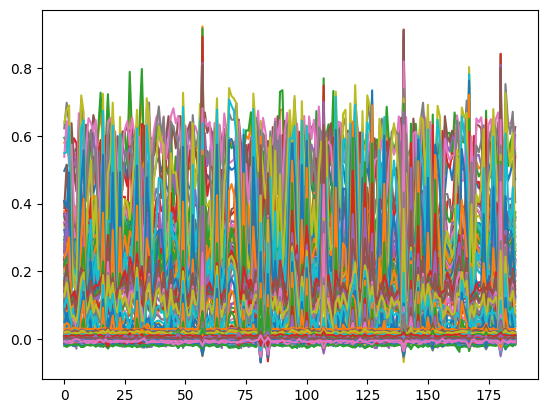

21/21 [==============================] - 1s 41ms/step - d_loss: 0.3914 - g_loss: 1.6203
Epoch 1602/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3682 - g_loss: 1.3652
Epoch 1603/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3294 - g_loss: 1.6893
Epoch 1604/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3911 - g_loss: 1.6977
Epoch 1605/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3033 - g_loss: 1.7227
Epoch 1606/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.4238 - g_loss: 1.8532
Epoch 1607/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.3820 - g_loss: 1.5892
Epoch 1608/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.4609 - g_loss: 1.8180
Epoch 1609/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.4329 - g_loss: 1.3497
Epoch 1610/2000
21/21 [==============================] - 0s 18ms/step - d_loss: 

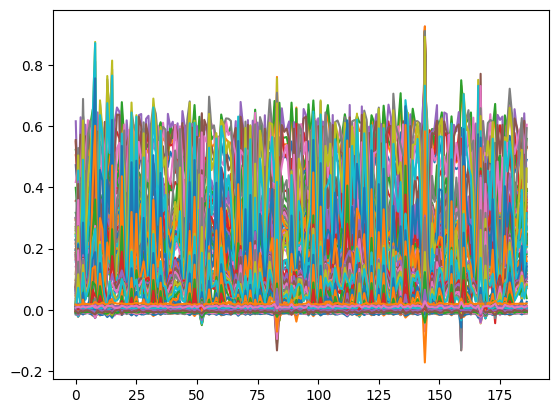

21/21 [==============================] - 1s 43ms/step - d_loss: 0.4195 - g_loss: 1.4756
Epoch 1702/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3847 - g_loss: 1.5277
Epoch 1703/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4158 - g_loss: 1.7447
Epoch 1704/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.3280 - g_loss: 1.5972
Epoch 1705/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.5177 - g_loss: 1.6933
Epoch 1706/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2519 - g_loss: 1.4959
Epoch 1707/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.4111 - g_loss: 1.8264
Epoch 1708/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3550 - g_loss: 1.6588
Epoch 1709/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.5084 - g_loss: 1.7256
Epoch 1710/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 

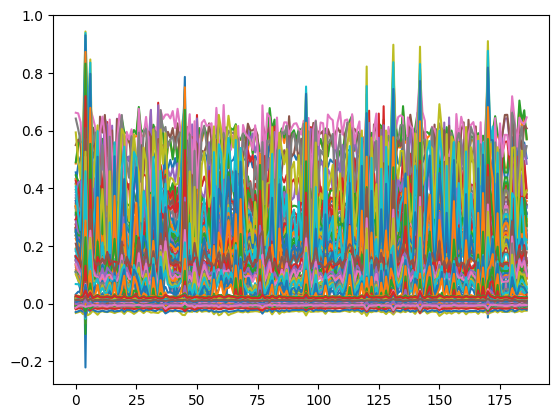

21/21 [==============================] - 1s 43ms/step - d_loss: 0.2507 - g_loss: 2.3754
Epoch 1802/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3849 - g_loss: 2.1876
Epoch 1803/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2164 - g_loss: 1.8998
Epoch 1804/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3323 - g_loss: 1.8218
Epoch 1805/2000
21/21 [==============================] - 0s 14ms/step - d_loss: 0.3465 - g_loss: 1.9499
Epoch 1806/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3259 - g_loss: 1.9945
Epoch 1807/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3465 - g_loss: 1.7524
Epoch 1808/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.2727 - g_loss: 1.7449
Epoch 1809/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3213 - g_loss: 1.9005
Epoch 1810/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 

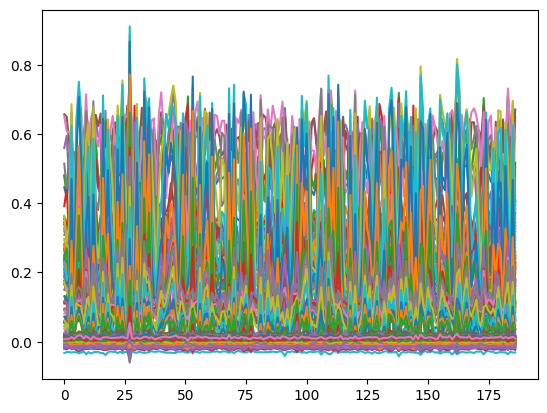

21/21 [==============================] - 1s 42ms/step - d_loss: 0.3722 - g_loss: 2.1105
Epoch 1902/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.2565 - g_loss: 1.8841
Epoch 1903/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.4606 - g_loss: 1.5859
Epoch 1904/2000
21/21 [==============================] - 0s 13ms/step - d_loss: 0.3353 - g_loss: 1.5280
Epoch 1905/2000
21/21 [==============================] - 0s 12ms/step - d_loss: 0.3216 - g_loss: 1.8113
Epoch 1906/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.2992 - g_loss: 1.7618
Epoch 1907/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3708 - g_loss: 1.8027
Epoch 1908/2000
21/21 [==============================] - 0s 16ms/step - d_loss: 0.3449 - g_loss: 1.7429
Epoch 1909/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 0.3473 - g_loss: 1.7358
Epoch 1910/2000
21/21 [==============================] - 0s 17ms/step - d_loss: 

In [12]:
cbk = keras.callbacks.LambdaCallback(on_epoch_end=lambda epoch,logs: show_samples(epoch, gan.generator, four))
%time hist = gan.fit(four, epochs=2000, callbacks=[cbk], verbose=True)
gan.save_weights('/content/drive/MyDrive/ecg/architektura3/four2000epok')


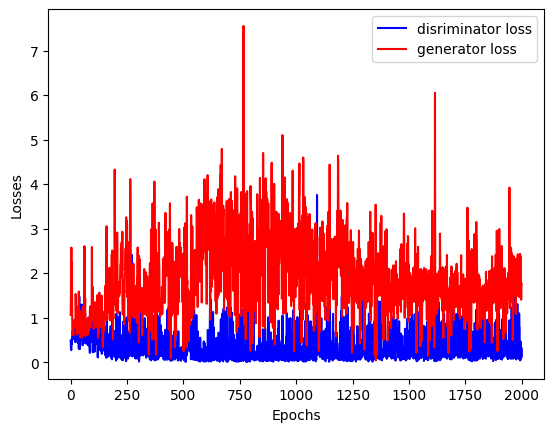

In [13]:
plt.plot(hist.history['d_loss'], color='blue', label='disriminator loss')
plt.plot(hist.history['g_loss'], color='red', label='generator loss')
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.legend()

WAGI DLA 2

In [69]:
#gan.save_weights('/content/drive/MyDrive/ecg/architektura3/four1700epok')

In [ ]:
gan.load_weights('/content/drive/MyDrive/ecg/two')

In [14]:
def do_data(nums):
    result = []
    latent_dim = 20
    num_samples_to_generate = 1

    for i in range(nums):
        # Generate new set of noise for each iteration
        latent_points = tf.random.normal(shape=(num_samples_to_generate, latent_dim))

        # Use the trained generator to generate data
        generated_data = generator(latent_points)

        # Squeeze the batch dimension, leaving (187, 1)
        generated_data = tf.squeeze(generated_data, axis=0)

        # Convert the TensorFlow tensor to a NumPy array
        generated_data_np = generated_data.numpy()

        # Add the generated data to the result list
        result.append(generated_data_np)

    # Convert the list to a NumPy array
    return np.array(result)

In [51]:
twos=do_data(20)
print(twos.shape)
print(twos[0].shape)
print(two.shape)
print(two[0].shape)
print(two[5])

(20, 187)
(187,)
(2223, 187)
(187,)
[0.45714285 0.45887445 0.47619047 0.31168831 0.14545455 0.11341992
 0.16277057 0.1922078  0.1982684  0.21298701 0.24069264 0.26320346
 0.28917749 0.32467532 0.35584416 0.37229438 0.37316018 0.37575758
 0.37922078 0.38181818 0.38268398 0.38701299 0.39307359 0.40086581
 0.4034632  0.41038961 0.42424242 0.44069264 0.45800866 0.48138529
 0.50995672 0.53506494 0.55584416 0.57402598 0.5974026  0.61385281
 0.61471862 0.60952381 0.5974026  0.57056277 0.53333334 0.4987013
 0.46839827 0.43809524 0.41038961 0.38961039 0.37662337 0.36709957
 0.35844156 0.35151516 0.35151516 0.35064936 0.34372295 0.34372295
 0.34805195 0.34545455 0.33852814 0.33419914 0.33073593 0.33073593
 0.33333333 0.33852813 0.35151514 0.36450216 0.36536796 0.36623376
 0.37229437 0.36709957 0.35238095 0.34718615 0.35064935 0.34891775
 0.34718615 0.35238096 0.35670996 0.35064936 0.34458875 0.34372295
 0.34632035 0.34718615 0.34458874 0.34718615 0.35151515 0.35584416
 0.35930736 0.38181818 0.45

In [ ]:
for i in range(len(twos)):
    plt.figure()
    plt.plot(twos[i], label='Wygenerowane')
    plt.plot(two[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()

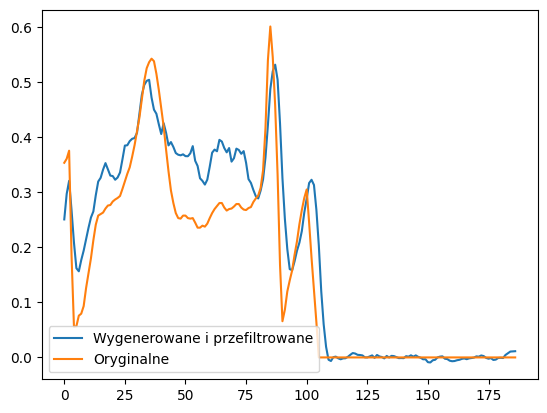

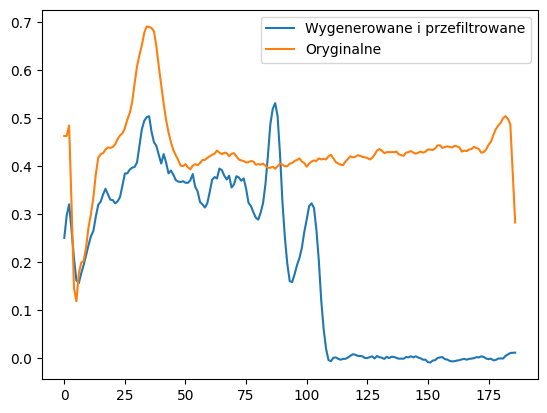

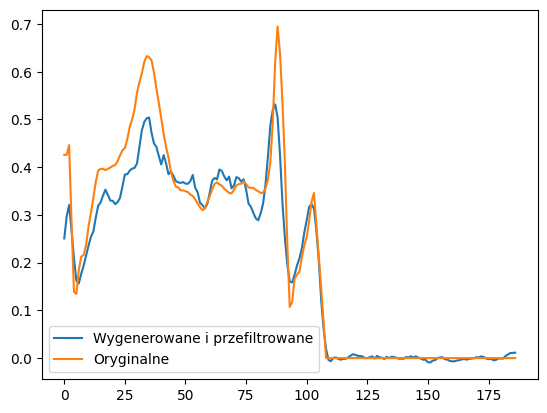

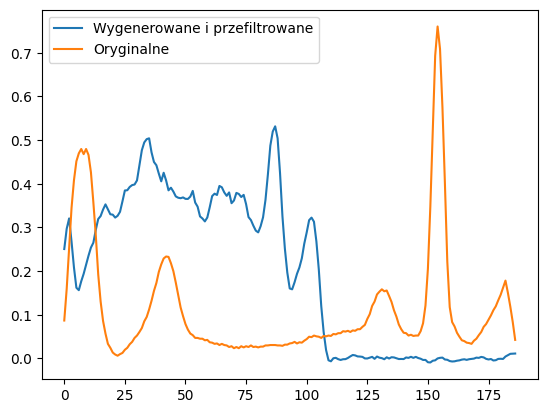

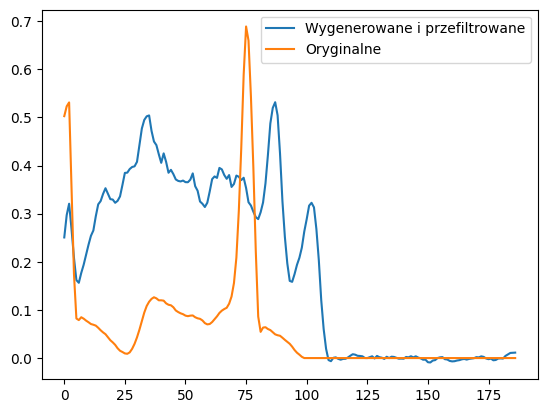

...

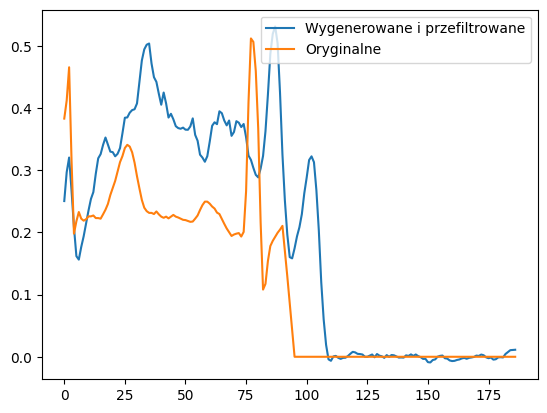

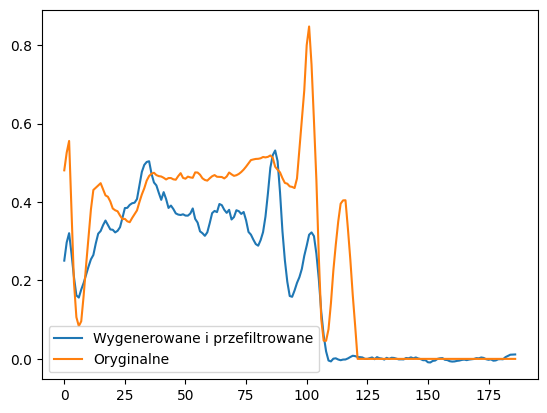

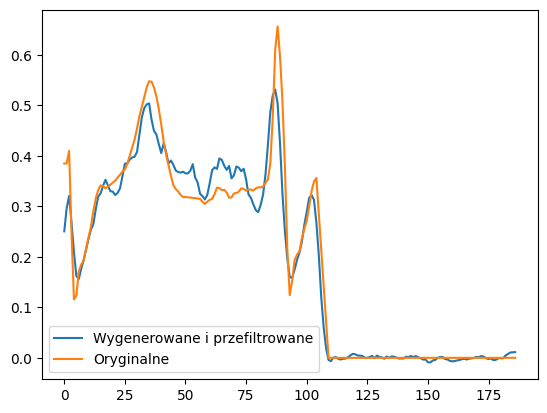

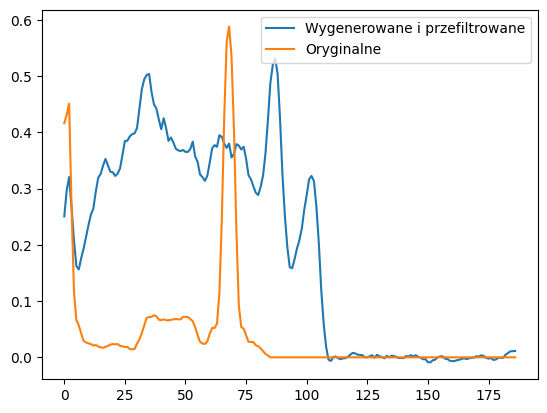

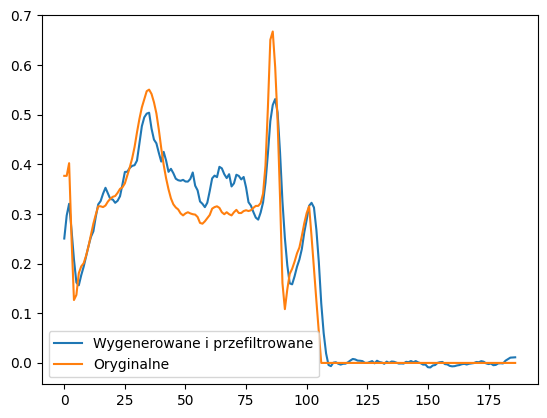

In [40]:
twos=moving_average_filter(twos)

for i in range(len(twos)):
    plt.figure()
    plt.plot(twos[i], label='Wygenerowane i przefiltrowane')
    plt.plot(two[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()

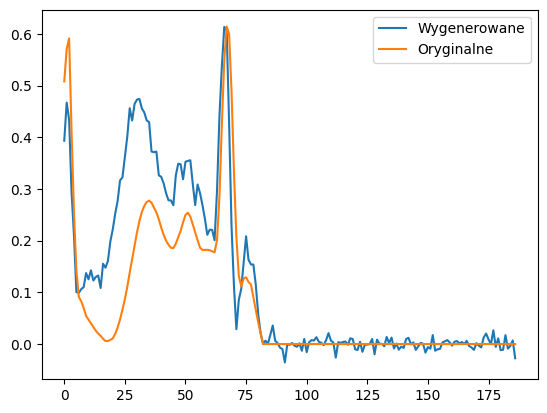

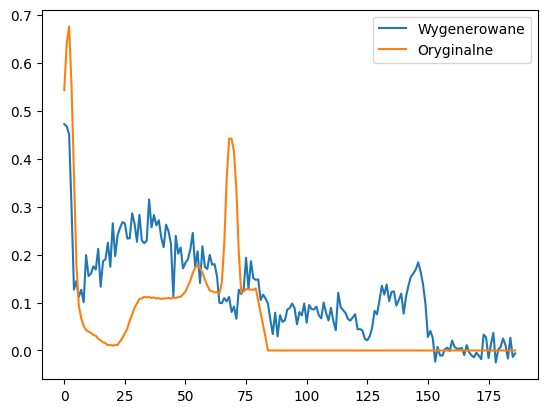

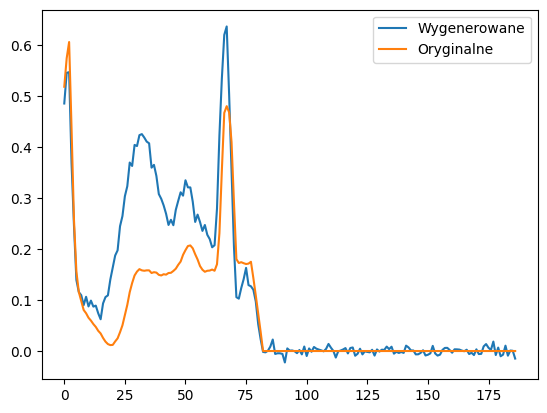

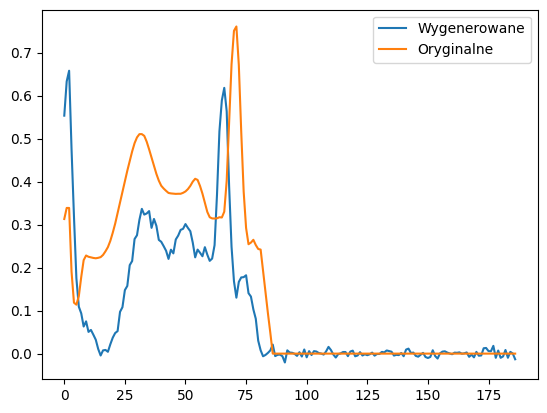

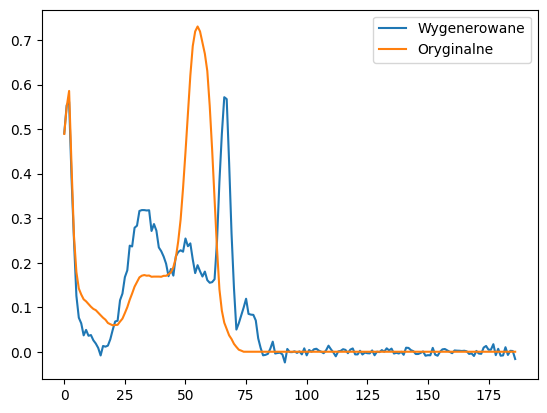

...

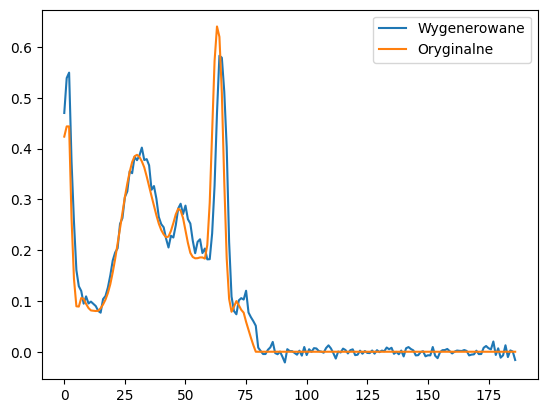

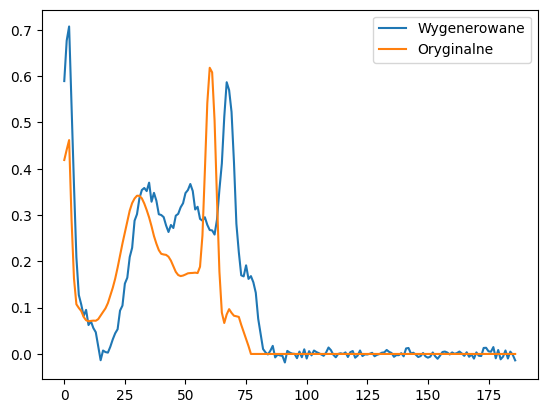

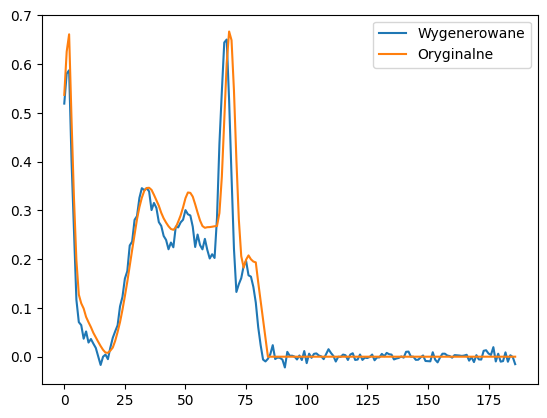

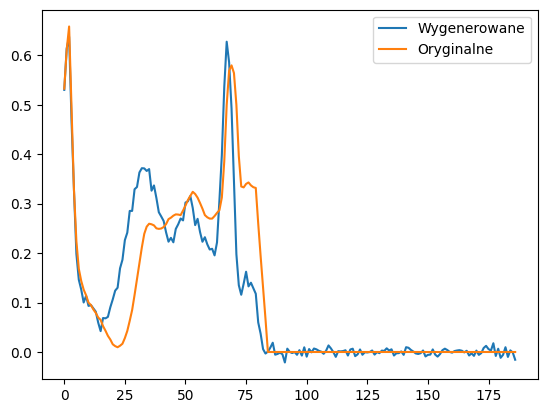

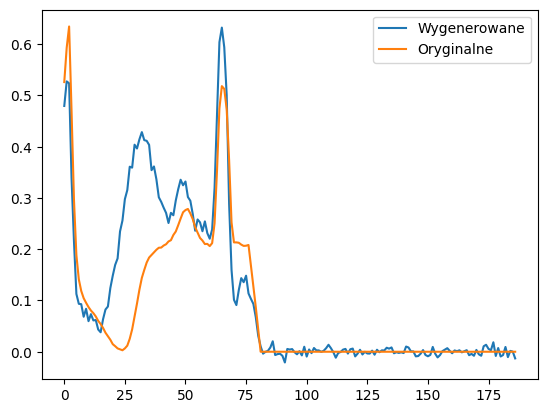

In [19]:
fours=do_data(20)

for i in range(len(fours)):
    plt.figure()
    plt.plot(fours[i], label='Wygenerowane')
    plt.plot(four[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()

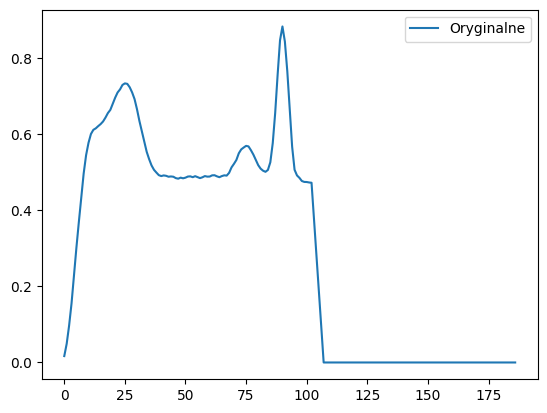

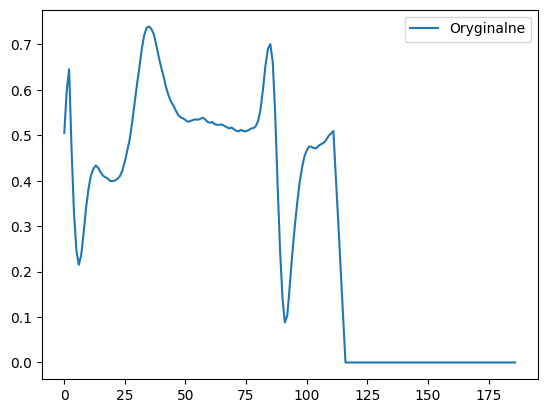

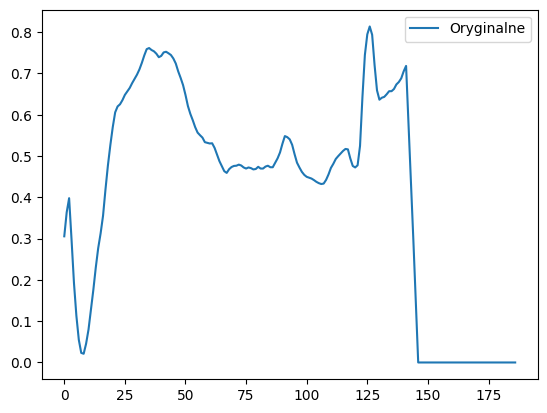

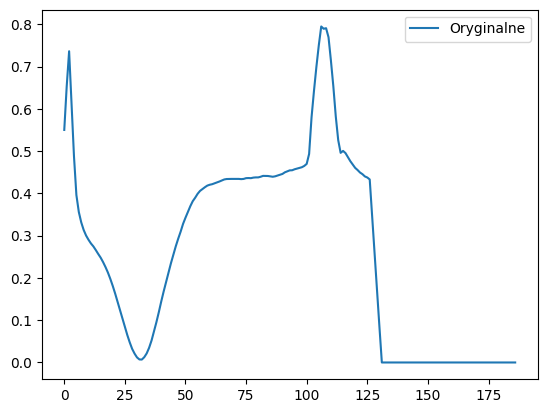

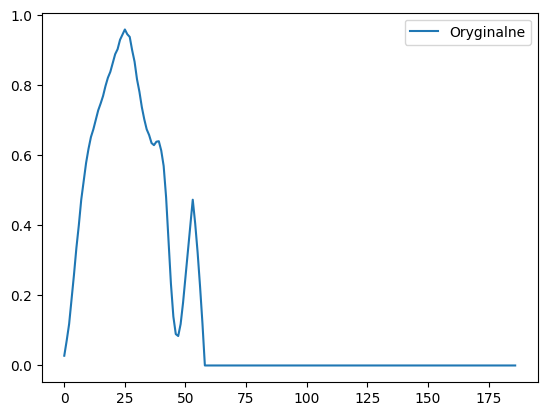

...

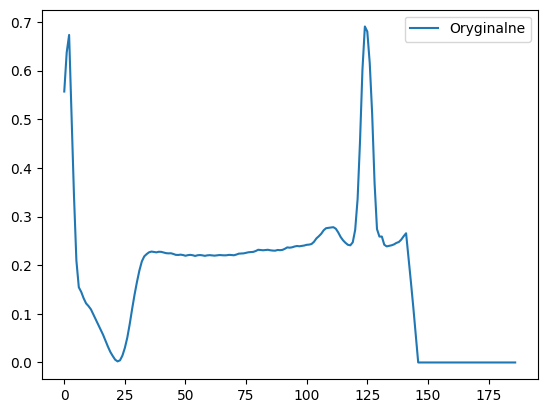

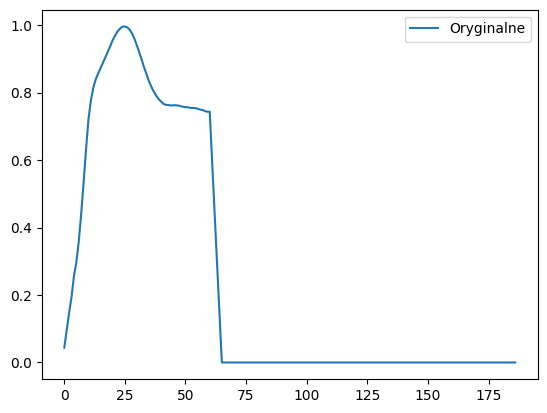

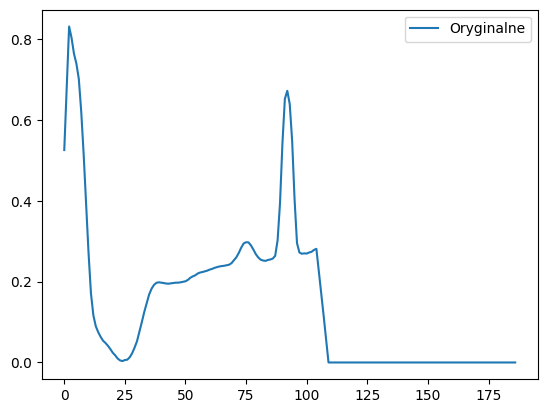

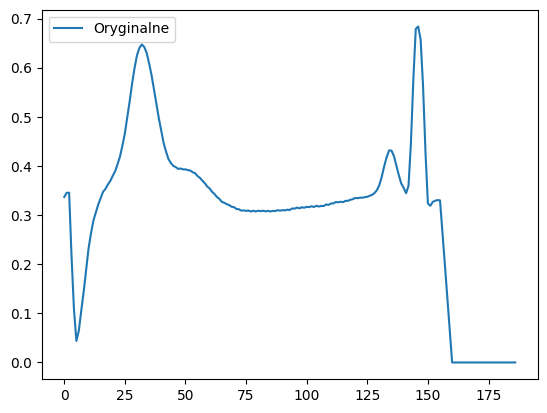

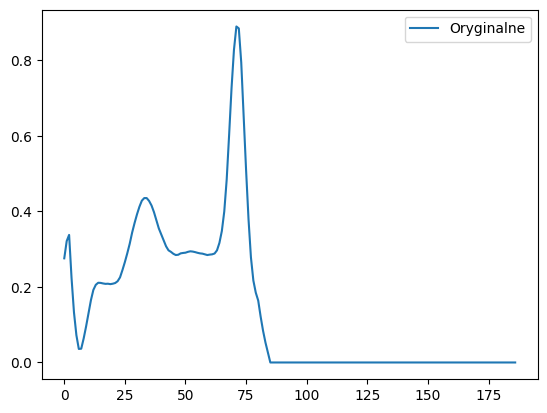

KeyboardInterrupt: ignored

In [22]:


for i in range(len(three)):
    plt.figure()
    plt.plot(three[i], label='Oryginalne')

    # Dodanie legendy do wykresu
    plt.legend()

    # Wyświetlenie wykresu
    plt.show()